## OUR PROJECT
![ACKLEY FUNCTION](截屏2023-06-07%20下午8.58.58.png)

## Normal ant colony algorithm

![ACKLEY FUNCTION](scatter_animation2.gif)

**Time**:about 20-21s 

**Result**:2997-3015

## improve ant colony algorithm

![ACKLEY FUNCTION](scatter_animation.gif)

**Time**:4s 

**Result**:2994-2996

## Self algorithm

![ACKLEY FUNCTION](Figure_1.png)

**Time**:2.5-2.7s 

**Result**:2994.4244657567374

TEST ON ACKLEY FUNCTION
![ACKLEY FUNCTION](截屏2024-02-02%20下午4.13.39_副本.png)


location:  [-14.862232046883474, -5.273113732920785, 17.03714104262717, -3.030455373890589, -26.614946327019666, -32.56759138239789, -32.206410268772395, 0.3779790436018302, -8.968314731351668, -22.130716525549353, 21.60685083351234, 31.13691719035266, -21.299815864270887, 22.809246398588236, 0.8557894217016802, -26.311695529576397, -22.88089056384758, 9.941404455081015, -25.861146573911263, 21.079885411739824, -21.19530375932398, 31.026969088911706, -9.740426653368319, -20.79150132154349, 26.858067811573733, 25.322570082092753, 25.21865963101513, -21.367100005119408, 15.881761181411356, 9.129473819832143, 8.508729175441003, 19.68784289290395, -25.794525204386208, -14.866237051193341, 18.751821508500157, 2.281477073925875, 8.108981518978428, -31.192022969500687, 6.84820485628389, 11.790974432939992, -12.586676864851805, -24.320240150707395, -21.90629964070848, 1.1288017278599656, 30.964826776980868, -6.326971862289545, -25.330095511758046, -5.77928411159719, -19.960044080793363, 10.525

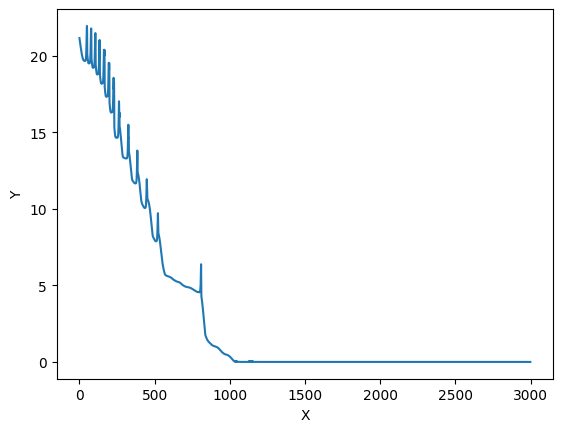

In [28]:
import numpy as np
import torch
from torch.autograd import Variable
import random
import time
import matplotlib.pyplot as plt

class Check:
    def __init__(self,sizevalue):
        self.stoyvalue = [0] * sizevalue
        self.position = 0 
        self.size = sizevalue
        self.num = 0
    def updateposition(self):
        self.position = self.position + 1
        self.num = self.num + 1
        if(self.position == self.size):
            self.position = 0
        
    

    def updatevalue(self,value):
        self.stoyvalue[self.position] = value
        self.updateposition()

    def returnmeanvalue(self):
        sum = 0
        if(self.num < self.size):
            for i in range(self.num):
                sum = sum  + self.stoyvalue[i]
            sum = sum/self.num
            return sum
        else:
            for i in range(self.size):
                sum = sum  + self.stoyvalue[i]
            sum = sum/self.size
        return sum
       
    
    def returnlastpos(self):
        if (self.position != 0):
            return self.stoyvalue[self.position-1]
        else:
            return self.stoyvalue[self.size-1]
    
    
    def checkwhethergetin(self):
        newsort = self.stoyvalue
        newsort.sort()
        if(((self.size-2)/(self.size-1))*(newsort[self.size-1] - newsort[0]) > newsort[(int)((self.size)/2)]-newsort[(int)((self.size/2)-1)] ):
            return False
        else:
            return True
    
    
    def returngap(self): 
        self.stoyvalue.sort()
        print(self.stoyvalue)
        for i in range(self.size-2):
            sum = self.stoyvalue[i+1] - self.stoyvalue[i]
        return sum/(self.size-1)

class anAnt:
    
        def __init__(self,limition):
            self.postion = np.random.uniform(limition[0],limition[1])
            self.oldpostion = self.postion
            self.limition = limition 
            self.gapbetween = self.limition[1] - self.limition[0]
        def movehead(self,speeddrop,learnspeed):
            if (speeddrop > 0 and (self.postion - 1/learnspeed*self.gapbetween) > self.limition[0]):
                self.postion = self.postion - 1/learnspeed*self.gapbetween
                return True
               
            if (speeddrop < 0 and (self.postion + 1/learnspeed*self.gapbetween) < self.limition[1]):
                self.postion = self.postion + 1/learnspeed*self.gapbetween
                return True
               
            self.postion = self.postion
            return True
           
        def updateoldpostion(self):
            self.oldpostion = self.postion
        
        def moveback(self):
          
            self.postion = self.oldpostion
        
def Antfunction(x):
    sum1 = 0
    sum2 = 0
    for i in range (0,len(x)):
        sum1 =  sum1 + x[i]**2
        sum2 = sum2 + torch.cos(2*torch.pi*x[i])
    f =  -20*torch.exp(-0.2*torch.sqrt((1/len(x))*sum1)) - torch.exp((1/len(x))*sum2) + 20 + torch.exp(torch.tensor(1.))
    return f


def countrigthnow(antArrey):
    a = Variable(torch.tensor(antArrey),requires_grad=True)
    c = Antfunction(a)
    c.backward()
    return a.grad
def sort(lst,list2):
    for w in range (0,len(lst)):
        lst[w] = lst[w]*list2[w]
    indexed_lst = list(enumerate(lst))

    # 对列表进行排序，排序规则是按照元素的值排序
    sorted_indexed_lst = sorted(indexed_lst, key=lambda x: x[1])

    # 获取排序后的元素在原数组中的位置
    original_indices = [i for i, v in sorted_indexed_lst]

    # 获取排序后的数组
    sorted_lst = [v for i, v in sorted_indexed_lst]
    return sorted_lst,original_indices
def plot_line_chart(data):
    x = range(len(data))  
    plt.plot(x, data)  
    plt.xlabel('X')  
    plt.ylabel('Y')  
    plt.show()  
def coutminvalue(learnspeed,learntime,changebatebig,changebatesamll,gapmin,sizestory,H):
    start_time = time.time()
    limition = []
    check = Check(sizestory)
    state = 0 #1 biggersearch 2 smallsearch 0 normal
    basicspeed = learnspeed
    vlauelist = []
    for i in range(H):
        limition.append([-32.768, 32.768])
    
   
    Antgroups = []
    Antpostiongroup = []
    dropspeedgroup = []

    for limitions in (limition):
            Antgroups.append(anAnt(limitions))
    Antpostiongroup = []
    for m in range(H):
        Antpostiongroup.append(Antgroups[m].postion) 
        
    #train now
    gap = []
    for m in range(H):
        gap.append(Antgroups[m].gapbetween) 
    for i in range(learntime):
        print("location: ",Antpostiongroup)
        dropspeedgroup = countrigthnow(Antpostiongroup)
        for j in range(0,H):
                j = H - 1 - j
                Antgroups[j].movehead(dropspeedgroup[j],learnspeed)
        Antpostiongroup = []
        for m in range(H):
            Antpostiongroup.append(Antgroups[m].postion) 
        for j in range(0,H):
            Antgroups[j].updateoldpostion()
       
        #查找领域 返现越界版本
        # postivego,postivego_minvalue = updatepositionpos(Antpostiongroup,i,shorertwide,10,dropspeedgroup,numsourrand)
        # nativego,nativego_minvalue = updatepositiona(Antpostiongroup,i,shorertwide,10,dropspeedgroup,numsourrand)
        torch.set_printoptions(precision=16)
        # print(postivego_minvalue,nativego_minvalue,nowvalue,i)
        value = Antfunction(torch.tensor(Antpostiongroup))
        lastvalue = check.returnlastpos()
        #change learnspeed
        if(i > sizestory):
            
            print("--------------------------------------")
            print("value: ",value)
           
            
            if ((abs(check.returnmeanvalue()-value)/check.returnmeanvalue()) < gapmin and state == 0 ):
                state = 1
            
            

            # if (state == 0 and value>check.returnlastpos()):
            #     learnspeed = basicspeed/changebate    
            #     state = 1
            
            if(check.checkwhethergetin()):
                learnspeed = learnspeed*changebatesamll
                
            
            if (state == 2 ):
                learnspeed = learnspeed*changebatesamll
                # basicspeed = learnspeed
              
               

            if (((check.returnmeanvalue()-value)/check.returnmeanvalue()) > gapmin and state== 1 and value < lastvalue ):
                learnspeed = basicspeed
                state = 0
                
              
                

            # if ((abs(check.returnmeanvalue()-value)/check.returnmeanvalue()) <= gapmin and state== 1 and value>check.returnlastpos() ):
            #     learnspeed = learnspeed/changebate
                
               
            
            if(value >= lastvalue and state == 1):
                learnspeed = learnspeed/changebatebig
               
                for j in range (H):
                    Antgroups[j].moveback()
                if (learnspeed < 2):
                    state = 2
        Antpostiongroup = []
        for m in range(H):
            Antpostiongroup.append(Antgroups[m].postion)        
        value1 = Antfunction(torch.tensor(Antpostiongroup))
        check.updatevalue(value1)
        vlauelist.append(value1)
       
       
        print("learnspeed: ",learnspeed)
       
    torch.set_printoptions(precision=16)
    print("-----------------------------------------------")
    endtime = time.time()
    print(Antpostiongroup)
    print(value)
    print("time: ",endtime-start_time," s")
    plot_line_chart(vlauelist)
    
# coutminvalue(learnspeed=3000,learntime=3000,gapmin=0.01,changebatebig=1.245,changebatesamll=2.3,sizestory=20)
coutminvalue(learnspeed=5000,learntime=3000,gapmin=0.01,changebatebig=1.38,changebatesamll=2.3,sizestory=8,H=100)



TEST ON GRIEWANK FUNCTION
![GRIEWANK FUNCTION](截屏2024-02-02%20下午4.22.03.png)

location:  [-455.23433428033024, -320.24545426757413, 484.5598226333567, -500.89185416014107, -420.50835648357304, 359.10198840988426, -433.84888389153355, 404.6157550706535, 128.3055944182396, -277.0642221483914, -132.38707564234636, -289.8935392877683, -582.8282354161396, 489.7036214890896, 159.18338071745524, 43.75537091992192, -130.61368553310783, 52.70041689981899, 131.7679232029123, 367.1127541953397, 330.1771270751472, 182.4639889136193, 392.6019923450065, -510.1514690669275, -64.73341190876845, 35.543784988637796, 227.93130166052816, -272.91174536751, 41.07285594398724, 80.86077749376605, -213.32168458216637, -261.28377823609094, 109.88152885179359, 190.56419857596242, 273.6652615496879, -12.08391178842585, 559.7505515053368, -67.44486439374597, 566.9794813223591, 62.74190144723328, 352.4484891396169, 69.82605433415046, -165.80609301242845, -256.82344420402035, -239.5001455811474, 143.794973452056, 160.92809031773095, 187.4151075333694, 242.0506710044928, 387.0278952237304, 152

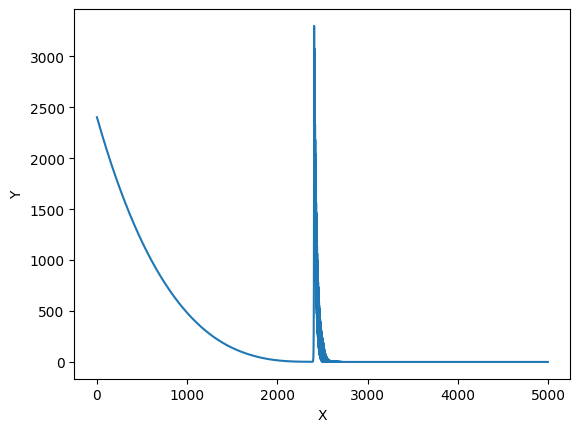

In [29]:
import numpy as np
import torch
from torch.autograd import Variable
import random
import time
import matplotlib.pyplot as plt
def check(x):
    return True

class Check:
    def __init__(self,sizevalue):
        self.stoyvalue = [0] * sizevalue
        self.position = 0 
        self.size = sizevalue
        self.num = 0
    def updateposition(self):
        self.position = self.position + 1
        self.num = self.num + 1
        if(self.position == self.size):
            self.position = 0
        
    

    def updatevalue(self,value):
        self.stoyvalue[self.position] = value
        self.updateposition()

    def returnmeanvalue(self):
        sum = 0
        if(self.num < self.size):
            for i in range(self.num):
                sum = sum  + self.stoyvalue[i]
            sum = sum/self.num
            return sum
        else:
            for i in range(self.size):
                sum = sum  + self.stoyvalue[i]
            sum = sum/self.size
        return sum
       
    
    def returnlastpos(self):
        if (self.position != 0):
            return self.stoyvalue[self.position-1]
        else:
            return self.stoyvalue[self.size-1]
    
    
    def checkwhethergetin(self):
        newsort = self.stoyvalue
        newsort.sort()
        if(((self.size-2)/(self.size-1))*(newsort[self.size-1] - newsort[0]) > newsort[(int)((self.size)/2)]-newsort[(int)((self.size/2)-1)] ):
            return False
        else:
            return True
    
    
    def returngap(self): 
        self.stoyvalue.sort()
        print(self.stoyvalue)
        for i in range(self.size-2):
            sum = self.stoyvalue[i+1] - self.stoyvalue[i]
        return sum/(self.size-1)

class anAnt:
    
        def __init__(self,limition):
            self.postion = np.random.uniform(limition[0],limition[1])
            self.oldpostion = self.postion
            self.limition = limition 
            self.gapbetween = self.limition[1] - self.limition[0]
        def movehead(self,speeddrop,learnspeed):
            if (speeddrop > 0 and (self.postion - 1/learnspeed*self.gapbetween) > self.limition[0]):
                self.postion = self.postion - 1/learnspeed*self.gapbetween
                return True
               
            if (speeddrop < 0 and (self.postion + 1/learnspeed*self.gapbetween) < self.limition[1]):
                self.postion = self.postion + 1/learnspeed*self.gapbetween
                return True
               
            self.postion = self.postion
            return True
           
        def updateoldpostion(self):
            self.oldpostion = self.postion
        
        def moveback(self):
          
            self.postion = self.oldpostion
            
def Antfunction(x):
    sum1 = 0
    sum2 = 1
    for i in range (0,len(x)):
        sum1 =  sum1 + x[i]**2/4000
        sum2 = sum2*torch.cos(x[i]/torch.sqrt(torch.tensor(i+1, dtype=torch.float)))
    f =  sum1 - sum2 + 1
    return f

def countrigthnow(antArrey):
    a = Variable(torch.tensor(antArrey),requires_grad=True)
    c = Antfunction(a)
    c.backward()
    return a.grad

def sort(lst,list2):
    for w in range (0,len(lst)):
        lst[w] = lst[w]*list2[w]
    indexed_lst = list(enumerate(lst))

    # 对列表进行排序，排序规则是按照元素的值排序
    sorted_indexed_lst = sorted(indexed_lst, key=lambda x: x[1])

    # 获取排序后的元素在原数组中的位置
    original_indices = [i for i, v in sorted_indexed_lst]

    # 获取排序后的数组
    sorted_lst = [v for i, v in sorted_indexed_lst]
    return sorted_lst,original_indices

def plot_line_chart(data):
    x = range(len(data))  
    plt.plot(x, data)  
    plt.xlabel('X')  
    plt.ylabel('Y')   
    plt.show()  # 显示图形

def coutminvalue(learnspeed,learntime,changebatebig,changebatesamll,gapmin,sizestory,H):
    start_time = time.time()
    limition = []
    check = Check(sizestory)
    state = 0 #1 biggersearch 2 smallsearch 0 normal
    basicspeed = learnspeed
    vlauelist = []
    for i in range(H):
        limition.append([-600, 600])
    
   
    Antgroups = []
    Antpostiongroup = []
    dropspeedgroup = []

    for limitions in (limition):
            Antgroups.append(anAnt(limitions))
    Antpostiongroup = []
    for m in range(H):
        Antpostiongroup.append(Antgroups[m].postion) 
        
    #train now
    gap = []
    for m in range(H):
        gap.append(Antgroups[m].gapbetween) 
    for i in range(learntime):
        print("location: ",Antpostiongroup)
        dropspeedgroup = countrigthnow(Antpostiongroup)
        for j in range(0,H):
                j = H - 1 - j
                Antgroups[j].movehead(dropspeedgroup[j],learnspeed)
        Antpostiongroup = []
        for m in range(H):
            Antpostiongroup.append(Antgroups[m].postion) 
        for j in range(0,H):
            Antgroups[j].updateoldpostion()
       
        #查找领域 返现越界版本
        # postivego,postivego_minvalue = updatepositionpos(Antpostiongroup,i,shorertwide,10,dropspeedgroup,numsourrand)
        # nativego,nativego_minvalue = updatepositiona(Antpostiongroup,i,shorertwide,10,dropspeedgroup,numsourrand)
        torch.set_printoptions(precision=16)
        # print(postivego_minvalue,nativego_minvalue,nowvalue,i)
        value = Antfunction(torch.tensor(Antpostiongroup))
        lastvalue = check.returnlastpos()
        #change learnspeed
        if(i > sizestory):
            
            print("--------------------------------------")
            print("value: ",value)
           
            
            if ((abs(check.returnmeanvalue()-value)/check.returnmeanvalue()) < gapmin and state == 0 ):
                state = 1
            
            

            # if (state == 0 and value>check.returnlastpos()):
            #     learnspeed = basicspeed/changebate    
            #     state = 1
            
            if(check.checkwhethergetin()):
                learnspeed = learnspeed*changebatesamll
                
            
            if (state == 2 ):
                learnspeed = learnspeed*1.02
                # basicspeed = learnspeed
              
               

            if (((check.returnmeanvalue()-value)/check.returnmeanvalue()) > gapmin and state== 1 and value < lastvalue ):
                learnspeed = basicspeed
                state = 0
                
              
                

            # if ((abs(check.returnmeanvalue()-value)/check.returnmeanvalue()) <= gapmin and state== 1 and value>check.returnlastpos() ):
            #     learnspeed = learnspeed/changebate
                
               
            
            if(value >= lastvalue and state == 1):
                learnspeed = learnspeed/changebatebig
               
                for j in range (H):
                    Antgroups[j].moveback()
                if (learnspeed < 2):
                    state = 2
        Antpostiongroup = []
        for m in range(H):
            Antpostiongroup.append(Antgroups[m].postion)        
        value1 = Antfunction(torch.tensor(Antpostiongroup))
        check.updatevalue(value1)
        vlauelist.append(value1)
       
       
        print("learnspeed: ",learnspeed)
       
    torch.set_printoptions(precision=16)
    print("-----------------------------------------------")
    endtime = time.time()
    print(Antpostiongroup)
    print(value)
    print("time: ",endtime-start_time," s")
    plot_line_chart(vlauelist)
    
# coutminvalue(learnspeed=3000,learntime=3000,gapmin=0.01,changebatebig=1.245,changebatesamll=2.3,sizestory=20)
coutminvalue(learnspeed=5000,learntime=5000,gapmin=0.008,changebatebig=1.28,changebatesamll=2.3,sizestory=16,H=100)

